# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:08<00:00, 6.90KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

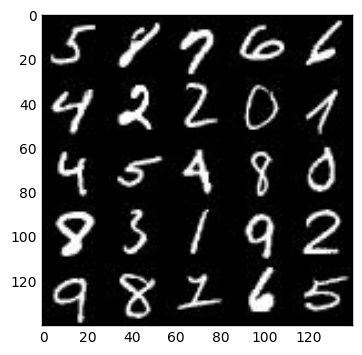

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

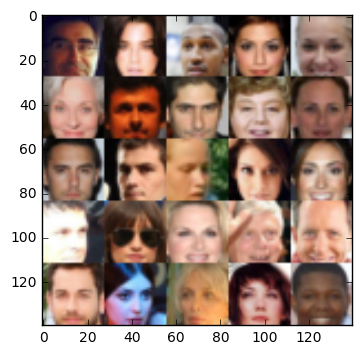

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [7]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    
    return input_real, input_z, learning_rate
    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [18]:
def discriminator(images, reuse=False, drop_rate=0.3, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        x1 = tf.layers.dropout(x1, rate=drop_rate, training=True)
        x1 = tf.layers.batch_normalization(x1, training=True)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.dropout(x2, rate=drop_rate, training=True)
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha * x2, x2) # Leaky ReLu
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.dropout(x3, rate=drop_rate, training=True)
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha * x3, x3) # Leaky ReLu
        
        flat = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1, activation=None)
        out = tf.sigmoid(logits)
        
        return out, logits



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [19]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    reuse_state = not is_train

    with tf.variable_scope('generator',reuse=reuse_state): 
        x1 = tf.layers.dense(z, 4*4*512)
        x1 = tf.reshape(x1,(-1,4,4,512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        
        x2 = tf.layers.conv2d_transpose(x1, 256 , 4,strides = 1, padding= 'valid' )
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides= 2, padding= 'same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides= 2, padding= 'same')    
        out = tf.tanh(logits)
        
        return out
    
    return None


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [20]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2, smooth=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1-smooth)))
 
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [21]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [22]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [23]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    n_samples, width, height, channels = data_shape
    input_real, input_z, learn_rate = model_inputs(width, height, channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learn_rate, beta1)
    
    steps = 0
    show_every = 100
    print_every = 20
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                batch_images *= 2
                # TODO: Train Model
                steps += 1
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})

                if steps % show_every == 0:
                    n_images = 16
                    show_generator_output(sess, n_images, input_z, channels, data_image_mode)

                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.5292... Generator Loss: 2.5781
Epoch 1/2... Discriminator Loss: 0.5144... Generator Loss: 2.1828
Epoch 1/2... Discriminator Loss: 0.5168... Generator Loss: 2.7946
Epoch 1/2... Discriminator Loss: 1.0169... Generator Loss: 1.0946


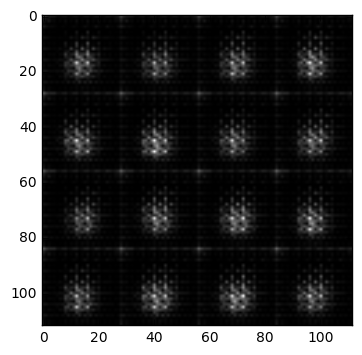

Epoch 1/2... Discriminator Loss: 0.9758... Generator Loss: 4.2914
Epoch 1/2... Discriminator Loss: 0.9461... Generator Loss: 2.8531
Epoch 1/2... Discriminator Loss: 0.4887... Generator Loss: 4.0909
Epoch 1/2... Discriminator Loss: 0.5311... Generator Loss: 3.1929
Epoch 1/2... Discriminator Loss: 0.7273... Generator Loss: 2.3438


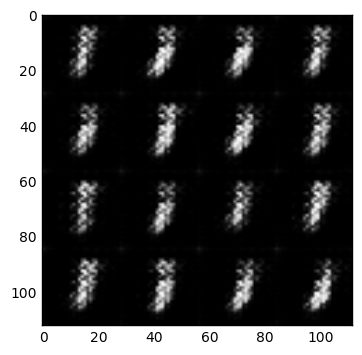

Epoch 1/2... Discriminator Loss: 0.6499... Generator Loss: 2.4093
Epoch 1/2... Discriminator Loss: 0.5677... Generator Loss: 5.0653
Epoch 1/2... Discriminator Loss: 0.9322... Generator Loss: 2.8337
Epoch 1/2... Discriminator Loss: 0.7050... Generator Loss: 2.7469
Epoch 1/2... Discriminator Loss: 0.9331... Generator Loss: 1.8604


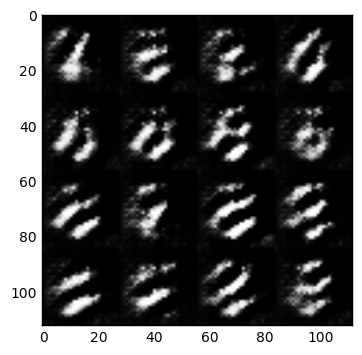

Epoch 1/2... Discriminator Loss: 0.9924... Generator Loss: 2.1675
Epoch 1/2... Discriminator Loss: 0.6531... Generator Loss: 3.1732
Epoch 1/2... Discriminator Loss: 1.7061... Generator Loss: 0.6462
Epoch 1/2... Discriminator Loss: 1.1070... Generator Loss: 1.1326
Epoch 1/2... Discriminator Loss: 0.8305... Generator Loss: 2.1456


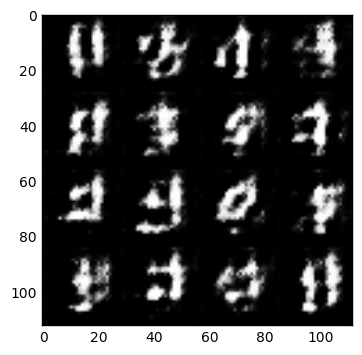

Epoch 1/2... Discriminator Loss: 1.6428... Generator Loss: 0.7613
Epoch 1/2... Discriminator Loss: 1.2104... Generator Loss: 1.2389
Epoch 1/2... Discriminator Loss: 1.0169... Generator Loss: 2.4839
Epoch 1/2... Discriminator Loss: 0.9493... Generator Loss: 1.2309
Epoch 1/2... Discriminator Loss: 1.1221... Generator Loss: 1.4977


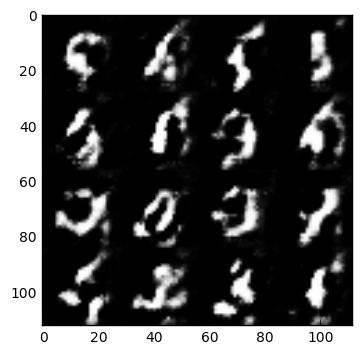

Epoch 1/2... Discriminator Loss: 1.2228... Generator Loss: 1.0448
Epoch 1/2... Discriminator Loss: 0.9399... Generator Loss: 1.2551
Epoch 1/2... Discriminator Loss: 1.0016... Generator Loss: 1.8922
Epoch 1/2... Discriminator Loss: 1.0138... Generator Loss: 1.0305
Epoch 1/2... Discriminator Loss: 0.8812... Generator Loss: 1.8160


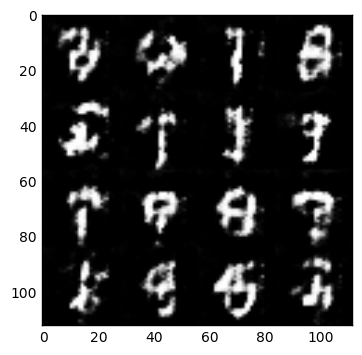

Epoch 1/2... Discriminator Loss: 0.8741... Generator Loss: 2.0029
Epoch 1/2... Discriminator Loss: 1.4072... Generator Loss: 1.0977
Epoch 1/2... Discriminator Loss: 1.2294... Generator Loss: 1.1929
Epoch 1/2... Discriminator Loss: 1.3517... Generator Loss: 0.7891
Epoch 1/2... Discriminator Loss: 1.3536... Generator Loss: 0.9217


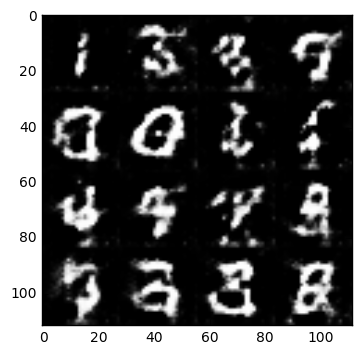

Epoch 1/2... Discriminator Loss: 1.4840... Generator Loss: 1.4073
Epoch 1/2... Discriminator Loss: 1.2997... Generator Loss: 1.4763
Epoch 1/2... Discriminator Loss: 1.5848... Generator Loss: 0.7471
Epoch 1/2... Discriminator Loss: 1.6037... Generator Loss: 0.9334
Epoch 1/2... Discriminator Loss: 1.2074... Generator Loss: 1.2922


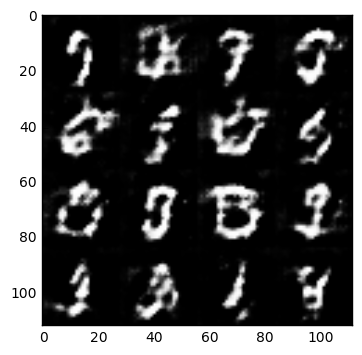

Epoch 1/2... Discriminator Loss: 1.0968... Generator Loss: 1.0690
Epoch 1/2... Discriminator Loss: 1.3325... Generator Loss: 1.3613
Epoch 1/2... Discriminator Loss: 1.0302... Generator Loss: 1.4720
Epoch 1/2... Discriminator Loss: 1.0775... Generator Loss: 1.3395
Epoch 1/2... Discriminator Loss: 1.1996... Generator Loss: 1.1063


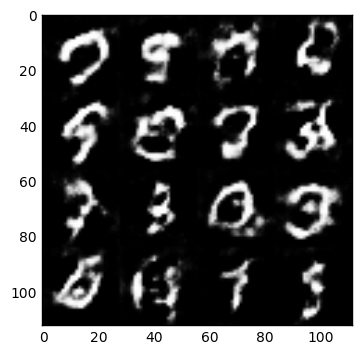

Epoch 1/2... Discriminator Loss: 1.3584... Generator Loss: 1.0614
Epoch 1/2... Discriminator Loss: 1.1146... Generator Loss: 1.2720
Epoch 1/2... Discriminator Loss: 1.2487... Generator Loss: 0.9782
Epoch 1/2... Discriminator Loss: 1.1133... Generator Loss: 1.5815
Epoch 1/2... Discriminator Loss: 1.2702... Generator Loss: 1.1553


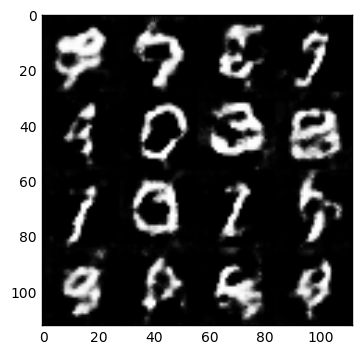

Epoch 1/2... Discriminator Loss: 1.3273... Generator Loss: 1.9432
Epoch 1/2... Discriminator Loss: 1.3144... Generator Loss: 0.8041
Epoch 1/2... Discriminator Loss: 1.2670... Generator Loss: 1.2618
Epoch 1/2... Discriminator Loss: 1.2071... Generator Loss: 1.3594
Epoch 1/2... Discriminator Loss: 1.2126... Generator Loss: 1.2187


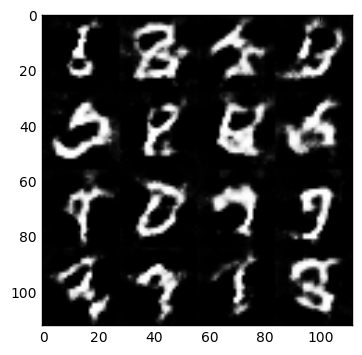

Epoch 1/2... Discriminator Loss: 1.4156... Generator Loss: 1.1624
Epoch 1/2... Discriminator Loss: 1.4223... Generator Loss: 0.8442
Epoch 1/2... Discriminator Loss: 1.3538... Generator Loss: 0.8132
Epoch 1/2... Discriminator Loss: 1.2148... Generator Loss: 1.0645
Epoch 1/2... Discriminator Loss: 1.1533... Generator Loss: 1.1681


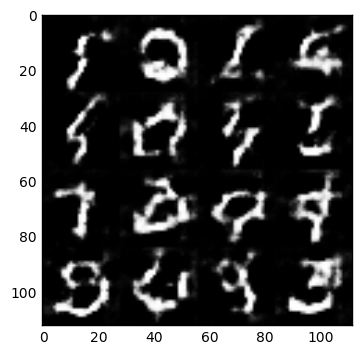

Epoch 1/2... Discriminator Loss: 1.4132... Generator Loss: 0.8445
Epoch 1/2... Discriminator Loss: 1.2738... Generator Loss: 1.1407
Epoch 1/2... Discriminator Loss: 1.1455... Generator Loss: 0.9318
Epoch 1/2... Discriminator Loss: 1.1155... Generator Loss: 1.3847
Epoch 1/2... Discriminator Loss: 1.3299... Generator Loss: 0.8846


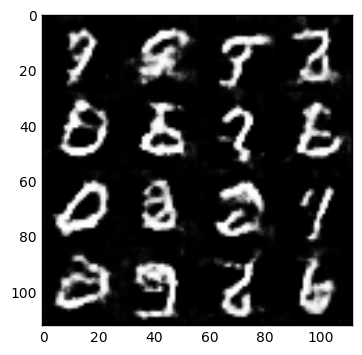

Epoch 1/2... Discriminator Loss: 1.2204... Generator Loss: 1.4327
Epoch 1/2... Discriminator Loss: 1.1848... Generator Loss: 1.1733
Epoch 1/2... Discriminator Loss: 1.2507... Generator Loss: 0.9089
Epoch 1/2... Discriminator Loss: 1.2419... Generator Loss: 0.6833
Epoch 1/2... Discriminator Loss: 1.1222... Generator Loss: 0.9949


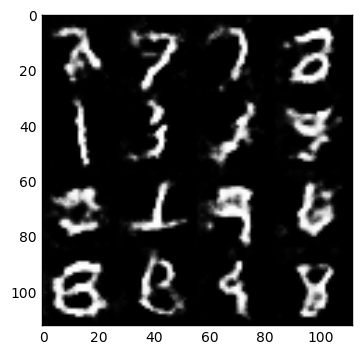

Epoch 1/2... Discriminator Loss: 1.1809... Generator Loss: 1.3407
Epoch 1/2... Discriminator Loss: 1.4245... Generator Loss: 1.2818
Epoch 1/2... Discriminator Loss: 1.3690... Generator Loss: 1.0047
Epoch 1/2... Discriminator Loss: 1.2371... Generator Loss: 0.9545
Epoch 1/2... Discriminator Loss: 1.2770... Generator Loss: 1.0752


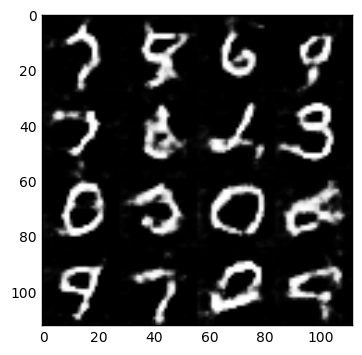

Epoch 1/2... Discriminator Loss: 1.3466... Generator Loss: 1.1770
Epoch 1/2... Discriminator Loss: 1.2877... Generator Loss: 0.8778
Epoch 1/2... Discriminator Loss: 1.2874... Generator Loss: 1.0237
Epoch 1/2... Discriminator Loss: 1.1251... Generator Loss: 1.4822
Epoch 1/2... Discriminator Loss: 1.3899... Generator Loss: 0.7750


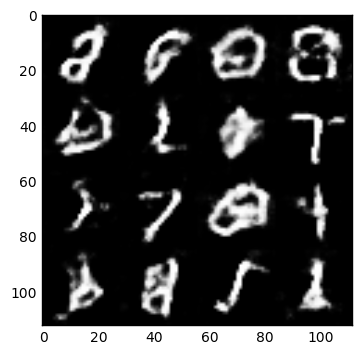

Epoch 1/2... Discriminator Loss: 1.0992... Generator Loss: 1.0828
Epoch 1/2... Discriminator Loss: 1.3493... Generator Loss: 1.1507
Epoch 1/2... Discriminator Loss: 1.2099... Generator Loss: 0.9662
Epoch 1/2... Discriminator Loss: 1.4945... Generator Loss: 0.7916
Epoch 1/2... Discriminator Loss: 1.2257... Generator Loss: 0.9213


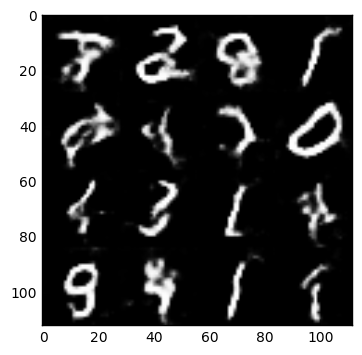

Epoch 1/2... Discriminator Loss: 1.2486... Generator Loss: 0.8357
Epoch 1/2... Discriminator Loss: 1.3944... Generator Loss: 1.0013
Epoch 1/2... Discriminator Loss: 1.1464... Generator Loss: 0.8646
Epoch 1/2... Discriminator Loss: 1.3085... Generator Loss: 1.2032
Epoch 1/2... Discriminator Loss: 1.1794... Generator Loss: 1.3828


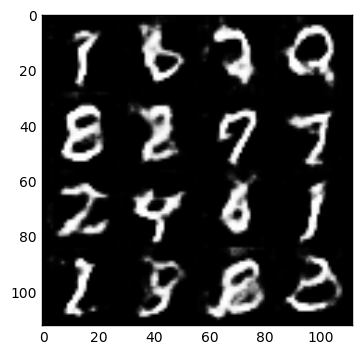

Epoch 1/2... Discriminator Loss: 1.2110... Generator Loss: 1.3043
Epoch 1/2... Discriminator Loss: 1.1417... Generator Loss: 1.0552
Epoch 1/2... Discriminator Loss: 1.1785... Generator Loss: 1.6372
Epoch 1/2... Discriminator Loss: 1.4997... Generator Loss: 0.7279
Epoch 2/2... Discriminator Loss: 1.3530... Generator Loss: 1.1225


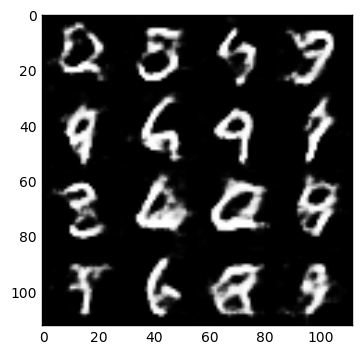

Epoch 2/2... Discriminator Loss: 1.2544... Generator Loss: 1.0810
Epoch 2/2... Discriminator Loss: 1.2795... Generator Loss: 0.9560
Epoch 2/2... Discriminator Loss: 1.1974... Generator Loss: 0.9194
Epoch 2/2... Discriminator Loss: 1.2418... Generator Loss: 1.1025
Epoch 2/2... Discriminator Loss: 1.3425... Generator Loss: 1.2503


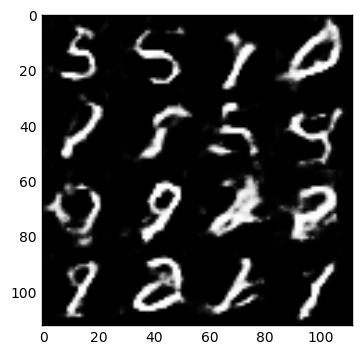

Epoch 2/2... Discriminator Loss: 1.0841... Generator Loss: 1.3197
Epoch 2/2... Discriminator Loss: 1.1364... Generator Loss: 0.7274
Epoch 2/2... Discriminator Loss: 1.1555... Generator Loss: 0.7886
Epoch 2/2... Discriminator Loss: 1.1801... Generator Loss: 1.2262
Epoch 2/2... Discriminator Loss: 1.1150... Generator Loss: 1.1609


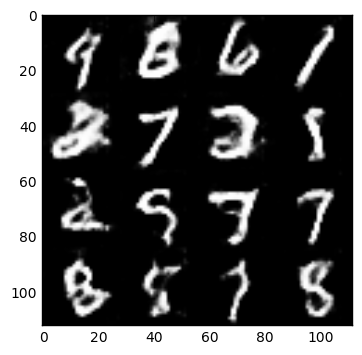

Epoch 2/2... Discriminator Loss: 1.0746... Generator Loss: 0.8649
Epoch 2/2... Discriminator Loss: 1.1609... Generator Loss: 1.0662
Epoch 2/2... Discriminator Loss: 1.2969... Generator Loss: 0.9345
Epoch 2/2... Discriminator Loss: 1.1732... Generator Loss: 0.8422
Epoch 2/2... Discriminator Loss: 1.2302... Generator Loss: 1.2369


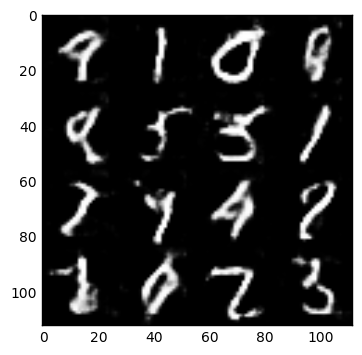

Epoch 2/2... Discriminator Loss: 1.3047... Generator Loss: 1.4488
Epoch 2/2... Discriminator Loss: 1.4476... Generator Loss: 0.6820
Epoch 2/2... Discriminator Loss: 1.3197... Generator Loss: 0.8598
Epoch 2/2... Discriminator Loss: 1.1139... Generator Loss: 1.2166
Epoch 2/2... Discriminator Loss: 1.3890... Generator Loss: 0.9857


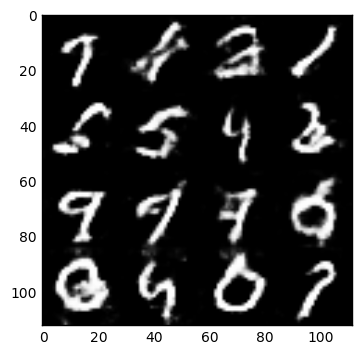

Epoch 2/2... Discriminator Loss: 1.2374... Generator Loss: 0.9677
Epoch 2/2... Discriminator Loss: 1.2497... Generator Loss: 1.0385
Epoch 2/2... Discriminator Loss: 1.1613... Generator Loss: 1.0170
Epoch 2/2... Discriminator Loss: 1.3137... Generator Loss: 1.0609
Epoch 2/2... Discriminator Loss: 1.2318... Generator Loss: 1.0851


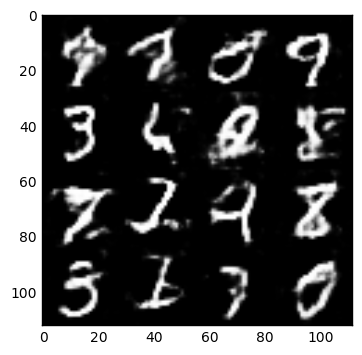

Epoch 2/2... Discriminator Loss: 1.0124... Generator Loss: 0.9301
Epoch 2/2... Discriminator Loss: 1.2235... Generator Loss: 1.0337
Epoch 2/2... Discriminator Loss: 1.2460... Generator Loss: 1.2364
Epoch 2/2... Discriminator Loss: 1.1982... Generator Loss: 1.1746
Epoch 2/2... Discriminator Loss: 1.3898... Generator Loss: 0.7763


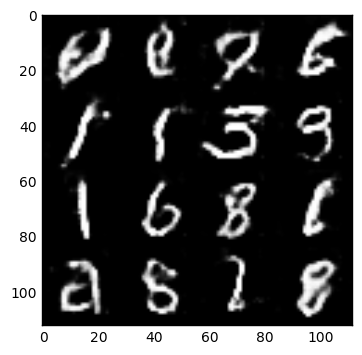

Epoch 2/2... Discriminator Loss: 1.2131... Generator Loss: 0.9503
Epoch 2/2... Discriminator Loss: 1.1150... Generator Loss: 0.8983
Epoch 2/2... Discriminator Loss: 1.1248... Generator Loss: 1.2345
Epoch 2/2... Discriminator Loss: 1.3197... Generator Loss: 1.1281
Epoch 2/2... Discriminator Loss: 1.2478... Generator Loss: 1.0723


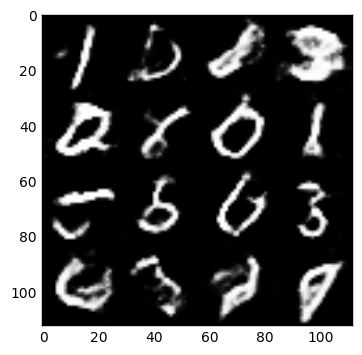

Epoch 2/2... Discriminator Loss: 1.2082... Generator Loss: 1.0227
Epoch 2/2... Discriminator Loss: 1.3383... Generator Loss: 0.9122
Epoch 2/2... Discriminator Loss: 1.2398... Generator Loss: 1.0791
Epoch 2/2... Discriminator Loss: 1.3462... Generator Loss: 1.2098
Epoch 2/2... Discriminator Loss: 1.3038... Generator Loss: 1.0602


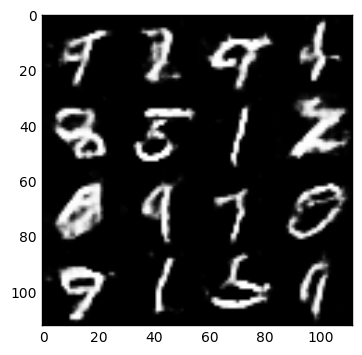

Epoch 2/2... Discriminator Loss: 1.0769... Generator Loss: 0.9491
Epoch 2/2... Discriminator Loss: 1.1245... Generator Loss: 1.0777
Epoch 2/2... Discriminator Loss: 1.3612... Generator Loss: 1.1046
Epoch 2/2... Discriminator Loss: 1.1140... Generator Loss: 1.0986
Epoch 2/2... Discriminator Loss: 1.2390... Generator Loss: 1.0671


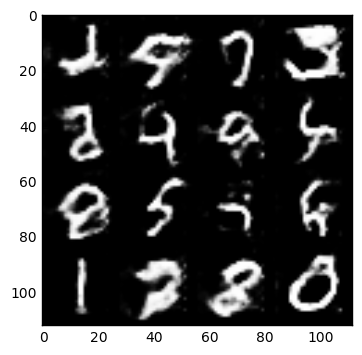

Epoch 2/2... Discriminator Loss: 1.1478... Generator Loss: 1.1759
Epoch 2/2... Discriminator Loss: 1.1559... Generator Loss: 1.3116
Epoch 2/2... Discriminator Loss: 1.2058... Generator Loss: 1.0555
Epoch 2/2... Discriminator Loss: 1.1509... Generator Loss: 1.0516
Epoch 2/2... Discriminator Loss: 1.1713... Generator Loss: 1.0170


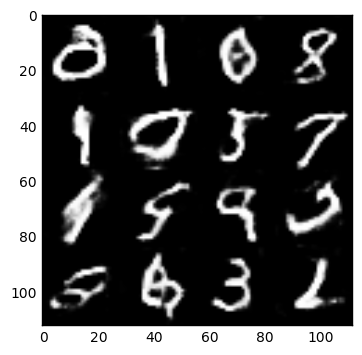

Epoch 2/2... Discriminator Loss: 1.2074... Generator Loss: 1.2664
Epoch 2/2... Discriminator Loss: 1.3041... Generator Loss: 1.1264
Epoch 2/2... Discriminator Loss: 1.1054... Generator Loss: 1.5804
Epoch 2/2... Discriminator Loss: 1.1678... Generator Loss: 1.6640
Epoch 2/2... Discriminator Loss: 1.1392... Generator Loss: 1.2620


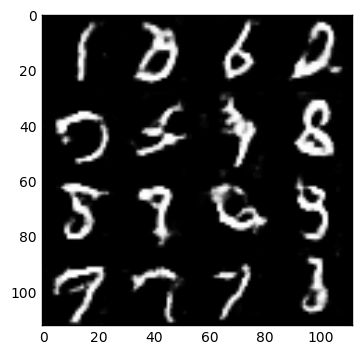

Epoch 2/2... Discriminator Loss: 1.2806... Generator Loss: 1.1828
Epoch 2/2... Discriminator Loss: 1.1967... Generator Loss: 0.8127
Epoch 2/2... Discriminator Loss: 1.2394... Generator Loss: 0.7271
Epoch 2/2... Discriminator Loss: 1.2296... Generator Loss: 1.1499
Epoch 2/2... Discriminator Loss: 1.0643... Generator Loss: 1.1995


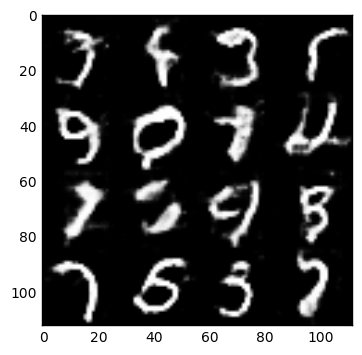

Epoch 2/2... Discriminator Loss: 1.3606... Generator Loss: 0.8616
Epoch 2/2... Discriminator Loss: 1.2829... Generator Loss: 0.8095
Epoch 2/2... Discriminator Loss: 1.1770... Generator Loss: 0.9291
Epoch 2/2... Discriminator Loss: 1.2102... Generator Loss: 1.0227
Epoch 2/2... Discriminator Loss: 1.3070... Generator Loss: 1.4858


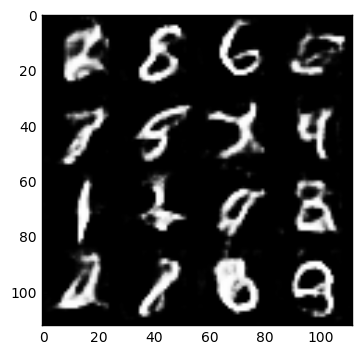

Epoch 2/2... Discriminator Loss: 1.3940... Generator Loss: 1.1093
Epoch 2/2... Discriminator Loss: 1.1512... Generator Loss: 1.3612
Epoch 2/2... Discriminator Loss: 1.3790... Generator Loss: 1.1389
Epoch 2/2... Discriminator Loss: 1.1051... Generator Loss: 1.3608
Epoch 2/2... Discriminator Loss: 1.2249... Generator Loss: 0.8198


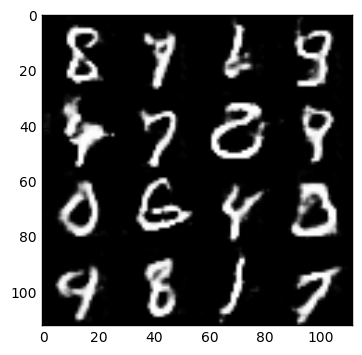

Epoch 2/2... Discriminator Loss: 1.2018... Generator Loss: 0.9883
Epoch 2/2... Discriminator Loss: 1.2356... Generator Loss: 0.9684
Epoch 2/2... Discriminator Loss: 1.1916... Generator Loss: 1.0019
Epoch 2/2... Discriminator Loss: 1.2602... Generator Loss: 1.0684
Epoch 2/2... Discriminator Loss: 1.3157... Generator Loss: 1.1619


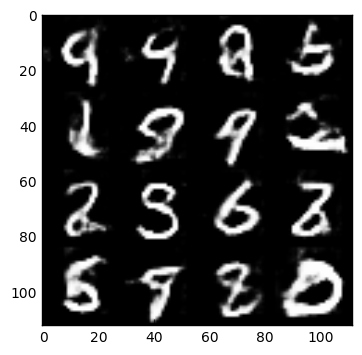

Epoch 2/2... Discriminator Loss: 1.1640... Generator Loss: 1.0703
Epoch 2/2... Discriminator Loss: 1.1006... Generator Loss: 0.9931
Epoch 2/2... Discriminator Loss: 1.2864... Generator Loss: 1.3194
Epoch 2/2... Discriminator Loss: 1.2647... Generator Loss: 1.2021
Epoch 2/2... Discriminator Loss: 1.2572... Generator Loss: 0.9110


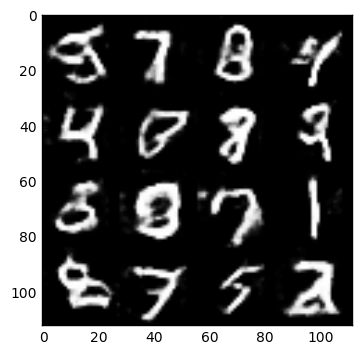

Epoch 2/2... Discriminator Loss: 1.1668... Generator Loss: 1.0614
Epoch 2/2... Discriminator Loss: 1.2543... Generator Loss: 0.7269
Epoch 2/2... Discriminator Loss: 1.4455... Generator Loss: 0.8197
Epoch 2/2... Discriminator Loss: 1.2801... Generator Loss: 0.9081
Epoch 2/2... Discriminator Loss: 1.2593... Generator Loss: 0.8879


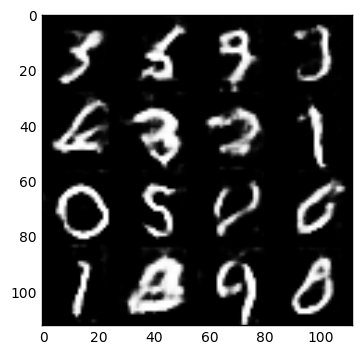

Epoch 2/2... Discriminator Loss: 1.2176... Generator Loss: 0.8640
Epoch 2/2... Discriminator Loss: 1.1996... Generator Loss: 0.8723
Epoch 2/2... Discriminator Loss: 1.1662... Generator Loss: 1.0176
Epoch 2/2... Discriminator Loss: 1.2167... Generator Loss: 0.9981
Epoch 2/2... Discriminator Loss: 1.1235... Generator Loss: 0.9729


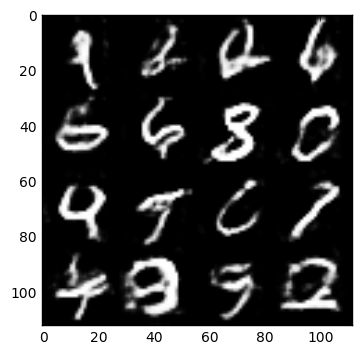

Epoch 2/2... Discriminator Loss: 1.2600... Generator Loss: 1.2505
Epoch 2/2... Discriminator Loss: 1.2173... Generator Loss: 0.7764
Epoch 2/2... Discriminator Loss: 1.2685... Generator Loss: 1.1315


In [24]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.7940... Generator Loss: 1.8152
Epoch 1/1... Discriminator Loss: 0.5576... Generator Loss: 3.0480
Epoch 1/1... Discriminator Loss: 0.4682... Generator Loss: 2.9600
Epoch 1/1... Discriminator Loss: 0.6881... Generator Loss: 1.8732


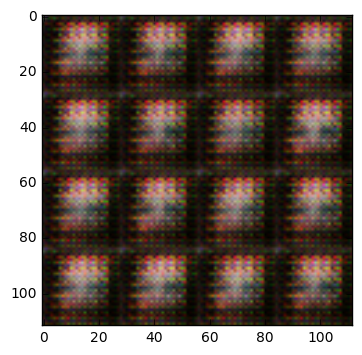

Epoch 1/1... Discriminator Loss: 0.5434... Generator Loss: 3.3387
Epoch 1/1... Discriminator Loss: 0.6150... Generator Loss: 3.2006
Epoch 1/1... Discriminator Loss: 0.6518... Generator Loss: 2.1355
Epoch 1/1... Discriminator Loss: 0.6139... Generator Loss: 3.0322
Epoch 1/1... Discriminator Loss: 0.5143... Generator Loss: 2.5535


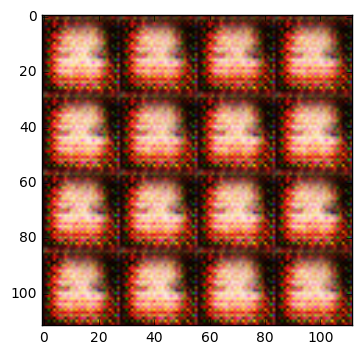

Epoch 1/1... Discriminator Loss: 0.5248... Generator Loss: 2.3841
Epoch 1/1... Discriminator Loss: 0.5183... Generator Loss: 2.6730
Epoch 1/1... Discriminator Loss: 0.6969... Generator Loss: 2.3192
Epoch 1/1... Discriminator Loss: 0.6849... Generator Loss: 2.7205
Epoch 1/1... Discriminator Loss: 0.5047... Generator Loss: 2.8593


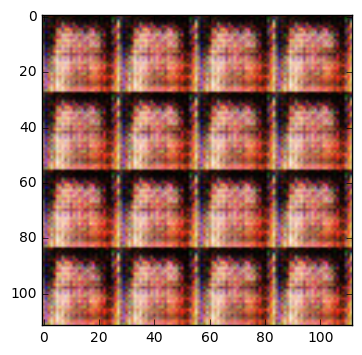

Epoch 1/1... Discriminator Loss: 0.5595... Generator Loss: 2.8418
Epoch 1/1... Discriminator Loss: 0.4871... Generator Loss: 3.6206
Epoch 1/1... Discriminator Loss: 0.4481... Generator Loss: 3.4741
Epoch 1/1... Discriminator Loss: 0.4060... Generator Loss: 3.1457
Epoch 1/1... Discriminator Loss: 0.4479... Generator Loss: 3.5153


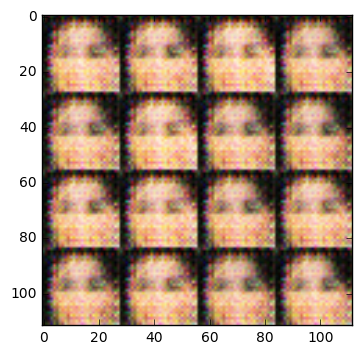

Epoch 1/1... Discriminator Loss: 0.5068... Generator Loss: 3.5899
Epoch 1/1... Discriminator Loss: 0.9777... Generator Loss: 0.9854
Epoch 1/1... Discriminator Loss: 1.1615... Generator Loss: 1.2749
Epoch 1/1... Discriminator Loss: 0.8339... Generator Loss: 2.2812
Epoch 1/1... Discriminator Loss: 0.8908... Generator Loss: 1.7068


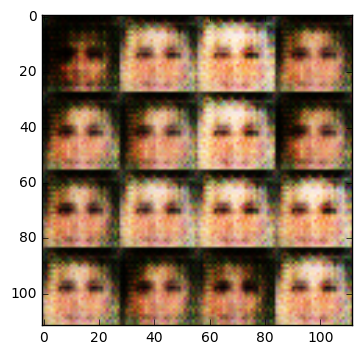

Epoch 1/1... Discriminator Loss: 0.8108... Generator Loss: 1.6254
Epoch 1/1... Discriminator Loss: 0.8003... Generator Loss: 2.1232
Epoch 1/1... Discriminator Loss: 0.6632... Generator Loss: 3.0816
Epoch 1/1... Discriminator Loss: 0.7744... Generator Loss: 1.4868
Epoch 1/1... Discriminator Loss: 1.1835... Generator Loss: 1.0788


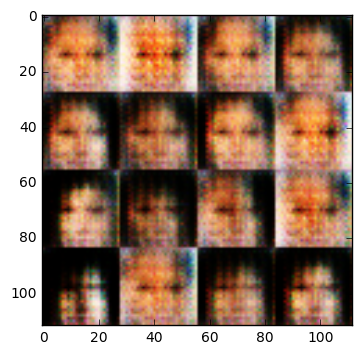

Epoch 1/1... Discriminator Loss: 0.8705... Generator Loss: 1.7048
Epoch 1/1... Discriminator Loss: 1.6073... Generator Loss: 0.8350
Epoch 1/1... Discriminator Loss: 1.1257... Generator Loss: 1.1473
Epoch 1/1... Discriminator Loss: 1.0907... Generator Loss: 1.3037
Epoch 1/1... Discriminator Loss: 1.1633... Generator Loss: 1.2179


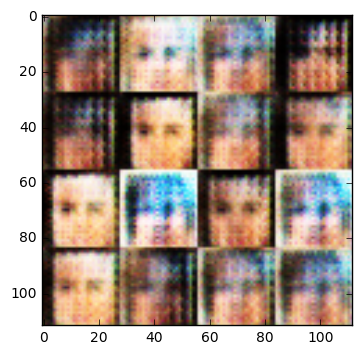

Epoch 1/1... Discriminator Loss: 0.8121... Generator Loss: 1.6831
Epoch 1/1... Discriminator Loss: 1.0666... Generator Loss: 1.4924
Epoch 1/1... Discriminator Loss: 0.9639... Generator Loss: 1.1291
Epoch 1/1... Discriminator Loss: 1.3059... Generator Loss: 1.4112
Epoch 1/1... Discriminator Loss: 1.1296... Generator Loss: 1.2193


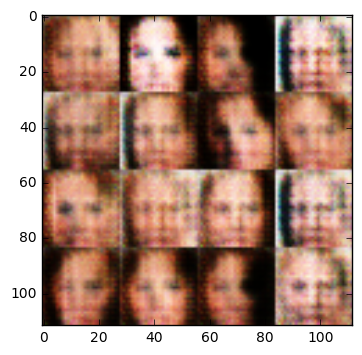

Epoch 1/1... Discriminator Loss: 0.9146... Generator Loss: 1.3970
Epoch 1/1... Discriminator Loss: 1.1376... Generator Loss: 1.4862
Epoch 1/1... Discriminator Loss: 0.9458... Generator Loss: 1.5819
Epoch 1/1... Discriminator Loss: 1.1888... Generator Loss: 0.8485
Epoch 1/1... Discriminator Loss: 0.9454... Generator Loss: 1.3847


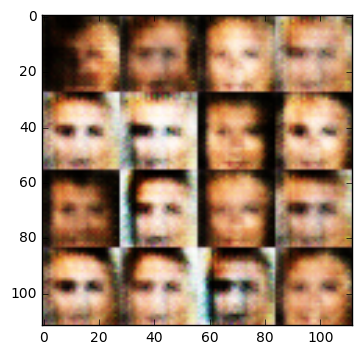

Epoch 1/1... Discriminator Loss: 1.1187... Generator Loss: 1.3281
Epoch 1/1... Discriminator Loss: 0.9534... Generator Loss: 1.2263
Epoch 1/1... Discriminator Loss: 1.0912... Generator Loss: 0.9675
Epoch 1/1... Discriminator Loss: 1.5066... Generator Loss: 1.6590
Epoch 1/1... Discriminator Loss: 0.9588... Generator Loss: 1.6306


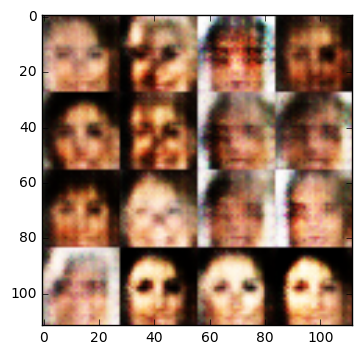

Epoch 1/1... Discriminator Loss: 1.0570... Generator Loss: 1.2991
Epoch 1/1... Discriminator Loss: 1.3236... Generator Loss: 0.8123
Epoch 1/1... Discriminator Loss: 1.1679... Generator Loss: 1.1804
Epoch 1/1... Discriminator Loss: 1.0774... Generator Loss: 1.2832
Epoch 1/1... Discriminator Loss: 1.2904... Generator Loss: 0.9570


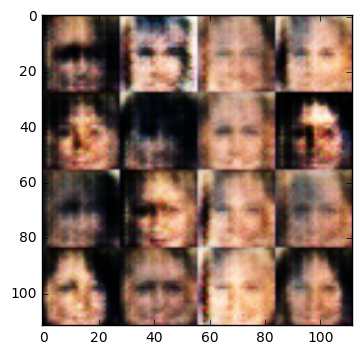

Epoch 1/1... Discriminator Loss: 0.9410... Generator Loss: 1.3826
Epoch 1/1... Discriminator Loss: 1.5350... Generator Loss: 0.5470
Epoch 1/1... Discriminator Loss: 0.9259... Generator Loss: 1.6815
Epoch 1/1... Discriminator Loss: 1.4102... Generator Loss: 2.1868
Epoch 1/1... Discriminator Loss: 1.1605... Generator Loss: 1.0334


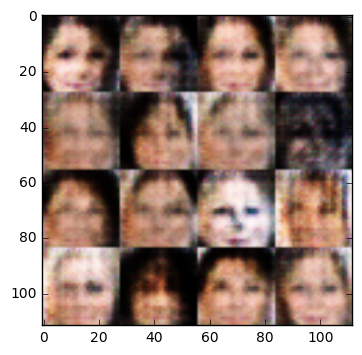

Epoch 1/1... Discriminator Loss: 1.3614... Generator Loss: 1.0162
Epoch 1/1... Discriminator Loss: 0.9719... Generator Loss: 1.4111
Epoch 1/1... Discriminator Loss: 1.3107... Generator Loss: 1.3405
Epoch 1/1... Discriminator Loss: 1.3242... Generator Loss: 1.3438
Epoch 1/1... Discriminator Loss: 1.3244... Generator Loss: 1.2405


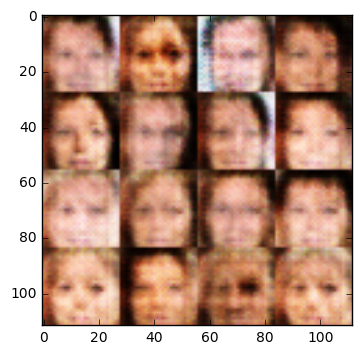

Epoch 1/1... Discriminator Loss: 1.0732... Generator Loss: 1.6492
Epoch 1/1... Discriminator Loss: 1.0212... Generator Loss: 1.2608
Epoch 1/1... Discriminator Loss: 1.1423... Generator Loss: 1.1291
Epoch 1/1... Discriminator Loss: 1.0627... Generator Loss: 1.2144
Epoch 1/1... Discriminator Loss: 1.0938... Generator Loss: 1.4616


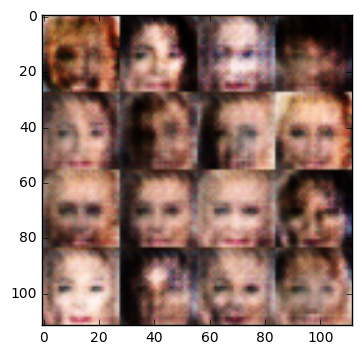

Epoch 1/1... Discriminator Loss: 1.2839... Generator Loss: 1.4157
Epoch 1/1... Discriminator Loss: 1.0224... Generator Loss: 1.6211
Epoch 1/1... Discriminator Loss: 1.2236... Generator Loss: 0.9541
Epoch 1/1... Discriminator Loss: 1.5761... Generator Loss: 0.5935
Epoch 1/1... Discriminator Loss: 1.2258... Generator Loss: 1.1634


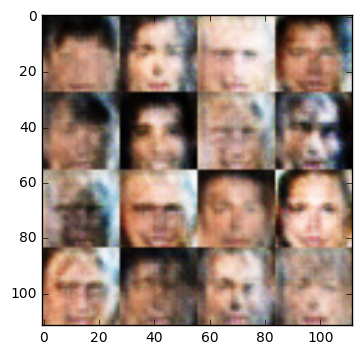

Epoch 1/1... Discriminator Loss: 1.2380... Generator Loss: 1.4987
Epoch 1/1... Discriminator Loss: 1.2853... Generator Loss: 1.1829
Epoch 1/1... Discriminator Loss: 1.0257... Generator Loss: 1.3273
Epoch 1/1... Discriminator Loss: 1.1418... Generator Loss: 1.0885
Epoch 1/1... Discriminator Loss: 1.1434... Generator Loss: 1.0213


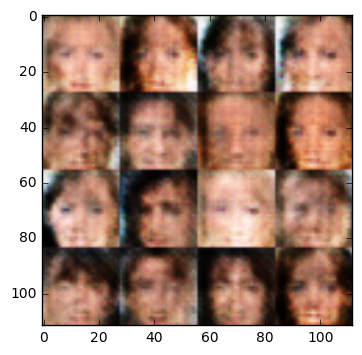

Epoch 1/1... Discriminator Loss: 1.1405... Generator Loss: 0.8102
Epoch 1/1... Discriminator Loss: 1.2698... Generator Loss: 0.8819
Epoch 1/1... Discriminator Loss: 1.4018... Generator Loss: 0.8322
Epoch 1/1... Discriminator Loss: 1.3530... Generator Loss: 0.8423
Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.9735


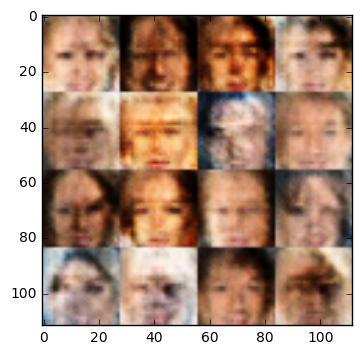

Epoch 1/1... Discriminator Loss: 1.2937... Generator Loss: 0.8743
Epoch 1/1... Discriminator Loss: 1.2740... Generator Loss: 1.5379
Epoch 1/1... Discriminator Loss: 1.1682... Generator Loss: 1.1623
Epoch 1/1... Discriminator Loss: 1.0621... Generator Loss: 1.1994
Epoch 1/1... Discriminator Loss: 1.2874... Generator Loss: 0.7936


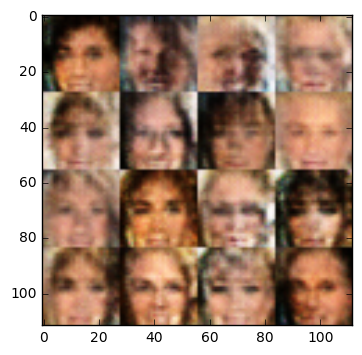

Epoch 1/1... Discriminator Loss: 1.4211... Generator Loss: 1.0782
Epoch 1/1... Discriminator Loss: 1.2571... Generator Loss: 1.0817
Epoch 1/1... Discriminator Loss: 1.3114... Generator Loss: 0.8152
Epoch 1/1... Discriminator Loss: 1.0347... Generator Loss: 1.0198
Epoch 1/1... Discriminator Loss: 1.1798... Generator Loss: 0.9086


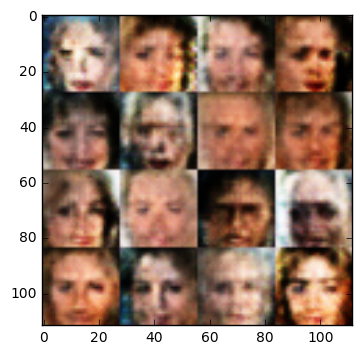

Epoch 1/1... Discriminator Loss: 1.3358... Generator Loss: 0.7959
Epoch 1/1... Discriminator Loss: 1.1611... Generator Loss: 1.0791
Epoch 1/1... Discriminator Loss: 1.4969... Generator Loss: 1.3188
Epoch 1/1... Discriminator Loss: 1.2416... Generator Loss: 1.0369
Epoch 1/1... Discriminator Loss: 1.4250... Generator Loss: 1.1658


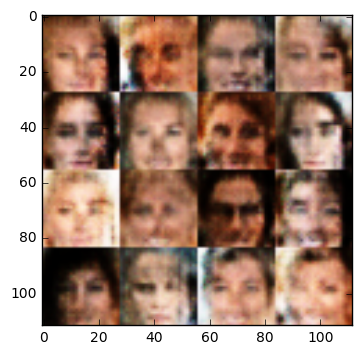

Epoch 1/1... Discriminator Loss: 1.0496... Generator Loss: 1.3539
Epoch 1/1... Discriminator Loss: 1.1990... Generator Loss: 1.2384
Epoch 1/1... Discriminator Loss: 1.1698... Generator Loss: 1.0222
Epoch 1/1... Discriminator Loss: 1.0772... Generator Loss: 1.4331
Epoch 1/1... Discriminator Loss: 1.3315... Generator Loss: 1.1821


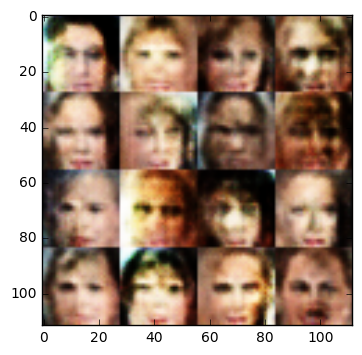

Epoch 1/1... Discriminator Loss: 1.3348... Generator Loss: 1.5723
Epoch 1/1... Discriminator Loss: 1.3663... Generator Loss: 1.7891
Epoch 1/1... Discriminator Loss: 1.0179... Generator Loss: 1.3312
Epoch 1/1... Discriminator Loss: 1.1225... Generator Loss: 0.9859
Epoch 1/1... Discriminator Loss: 1.3112... Generator Loss: 0.9567


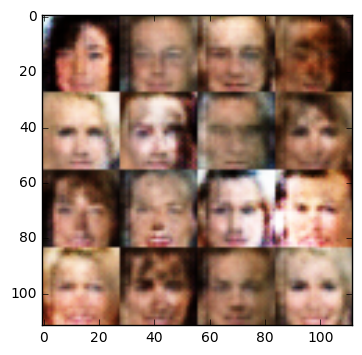

Epoch 1/1... Discriminator Loss: 1.1633... Generator Loss: 1.7404
Epoch 1/1... Discriminator Loss: 0.9186... Generator Loss: 1.4414
Epoch 1/1... Discriminator Loss: 1.1749... Generator Loss: 1.8742
Epoch 1/1... Discriminator Loss: 1.0812... Generator Loss: 1.2259
Epoch 1/1... Discriminator Loss: 0.9792... Generator Loss: 1.2296


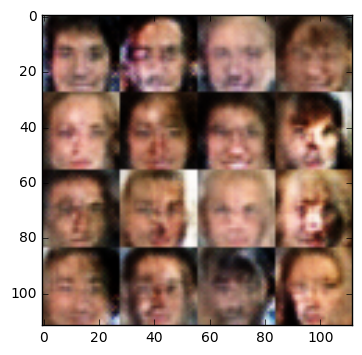

Epoch 1/1... Discriminator Loss: 0.9937... Generator Loss: 1.7189
Epoch 1/1... Discriminator Loss: 1.2582... Generator Loss: 0.8039
Epoch 1/1... Discriminator Loss: 1.0052... Generator Loss: 1.4369
Epoch 1/1... Discriminator Loss: 0.8968... Generator Loss: 1.8187
Epoch 1/1... Discriminator Loss: 1.3896... Generator Loss: 0.8545


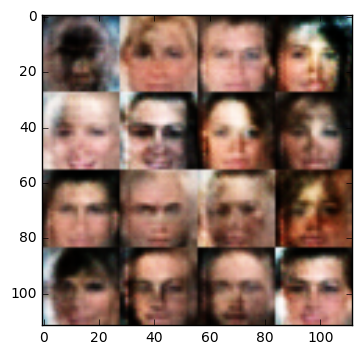

Epoch 1/1... Discriminator Loss: 1.0015... Generator Loss: 0.9273
Epoch 1/1... Discriminator Loss: 1.0216... Generator Loss: 1.6966
Epoch 1/1... Discriminator Loss: 1.4707... Generator Loss: 2.3556
Epoch 1/1... Discriminator Loss: 1.3662... Generator Loss: 1.3208
Epoch 1/1... Discriminator Loss: 0.8836... Generator Loss: 1.4132


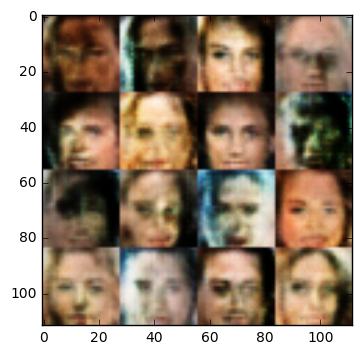

Epoch 1/1... Discriminator Loss: 1.2148... Generator Loss: 1.4463
Epoch 1/1... Discriminator Loss: 1.2554... Generator Loss: 0.7625
Epoch 1/1... Discriminator Loss: 1.2719... Generator Loss: 0.9268
Epoch 1/1... Discriminator Loss: 1.1364... Generator Loss: 1.8682
Epoch 1/1... Discriminator Loss: 1.3387... Generator Loss: 1.0018


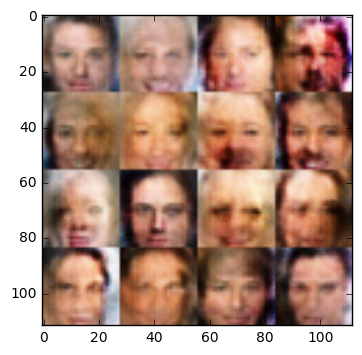

Epoch 1/1... Discriminator Loss: 1.6878... Generator Loss: 0.3897
Epoch 1/1... Discriminator Loss: 1.2708... Generator Loss: 0.8333
Epoch 1/1... Discriminator Loss: 1.5464... Generator Loss: 0.4555
Epoch 1/1... Discriminator Loss: 1.5417... Generator Loss: 0.9128
Epoch 1/1... Discriminator Loss: 1.2586... Generator Loss: 0.7041


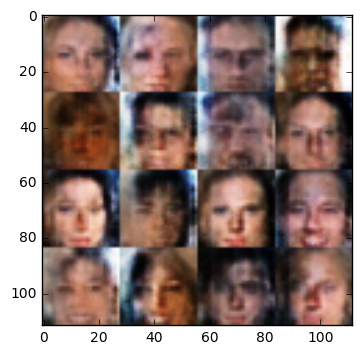

Epoch 1/1... Discriminator Loss: 1.1681... Generator Loss: 1.2551
Epoch 1/1... Discriminator Loss: 0.9793... Generator Loss: 1.0250
Epoch 1/1... Discriminator Loss: 1.1684... Generator Loss: 0.7454
Epoch 1/1... Discriminator Loss: 1.1793... Generator Loss: 0.8575
Epoch 1/1... Discriminator Loss: 1.4271... Generator Loss: 0.7687


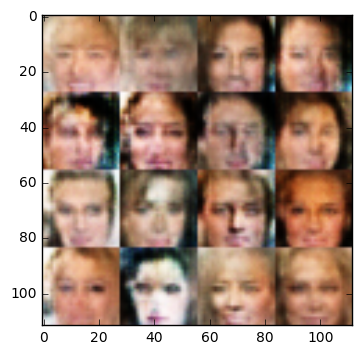

Epoch 1/1... Discriminator Loss: 1.4090... Generator Loss: 0.9502
Epoch 1/1... Discriminator Loss: 1.4977... Generator Loss: 0.8455
Epoch 1/1... Discriminator Loss: 1.1943... Generator Loss: 1.0761
Epoch 1/1... Discriminator Loss: 1.0473... Generator Loss: 0.9218
Epoch 1/1... Discriminator Loss: 1.5480... Generator Loss: 1.3409


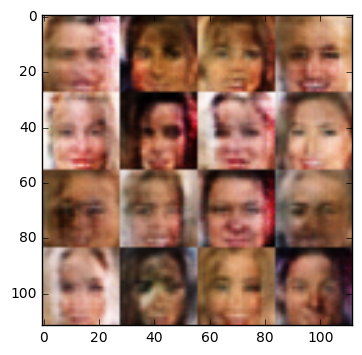

Epoch 1/1... Discriminator Loss: 1.1854... Generator Loss: 1.1162
Epoch 1/1... Discriminator Loss: 0.9598... Generator Loss: 1.5493
Epoch 1/1... Discriminator Loss: 1.1961... Generator Loss: 1.2614
Epoch 1/1... Discriminator Loss: 1.3918... Generator Loss: 0.9657
Epoch 1/1... Discriminator Loss: 1.2099... Generator Loss: 1.0460


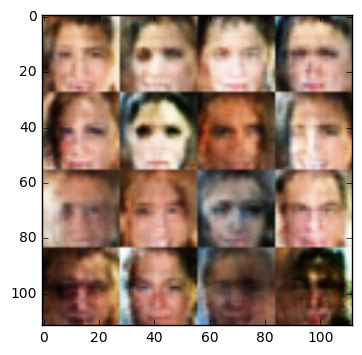

Epoch 1/1... Discriminator Loss: 1.2489... Generator Loss: 1.0222
Epoch 1/1... Discriminator Loss: 0.9731... Generator Loss: 1.7438
Epoch 1/1... Discriminator Loss: 1.1438... Generator Loss: 1.0508
Epoch 1/1... Discriminator Loss: 1.3060... Generator Loss: 0.9962
Epoch 1/1... Discriminator Loss: 1.4459... Generator Loss: 0.6624


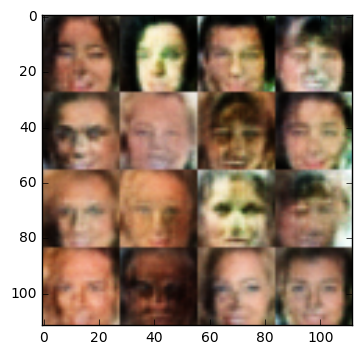

Epoch 1/1... Discriminator Loss: 1.1931... Generator Loss: 0.8889
Epoch 1/1... Discriminator Loss: 1.3753... Generator Loss: 0.8457
Epoch 1/1... Discriminator Loss: 1.2918... Generator Loss: 0.8165
Epoch 1/1... Discriminator Loss: 1.3491... Generator Loss: 0.6035
Epoch 1/1... Discriminator Loss: 1.0415... Generator Loss: 1.3106


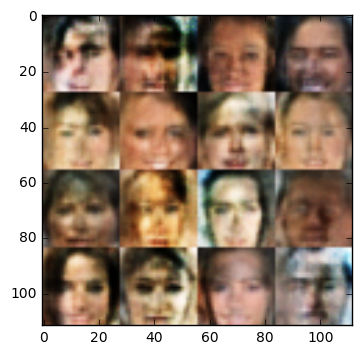

Epoch 1/1... Discriminator Loss: 1.2889... Generator Loss: 0.9207
Epoch 1/1... Discriminator Loss: 1.1254... Generator Loss: 1.0153
Epoch 1/1... Discriminator Loss: 1.2142... Generator Loss: 1.2528
Epoch 1/1... Discriminator Loss: 1.3522... Generator Loss: 1.0045
Epoch 1/1... Discriminator Loss: 1.1023... Generator Loss: 2.0612


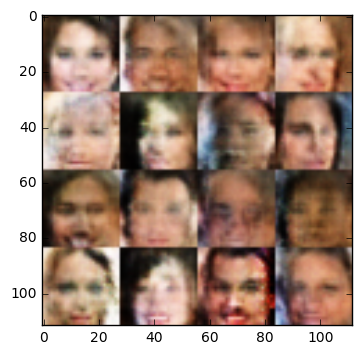

Epoch 1/1... Discriminator Loss: 1.3955... Generator Loss: 0.6071
Epoch 1/1... Discriminator Loss: 1.3587... Generator Loss: 0.9879
Epoch 1/1... Discriminator Loss: 1.4254... Generator Loss: 0.7503
Epoch 1/1... Discriminator Loss: 1.1567... Generator Loss: 1.0388
Epoch 1/1... Discriminator Loss: 1.3178... Generator Loss: 0.7149


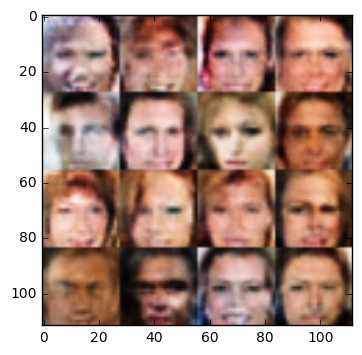

Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 0.6070
Epoch 1/1... Discriminator Loss: 1.0595... Generator Loss: 1.2980
Epoch 1/1... Discriminator Loss: 1.1671... Generator Loss: 0.9650
Epoch 1/1... Discriminator Loss: 1.2803... Generator Loss: 1.2546
Epoch 1/1... Discriminator Loss: 1.2782... Generator Loss: 1.2537


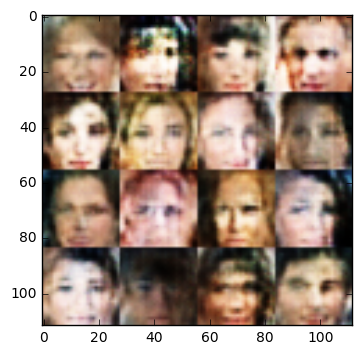

Epoch 1/1... Discriminator Loss: 1.1961... Generator Loss: 0.9280
Epoch 1/1... Discriminator Loss: 1.3811... Generator Loss: 0.7516
Epoch 1/1... Discriminator Loss: 1.1295... Generator Loss: 1.1766
Epoch 1/1... Discriminator Loss: 1.2612... Generator Loss: 0.8452
Epoch 1/1... Discriminator Loss: 1.2985... Generator Loss: 0.8654


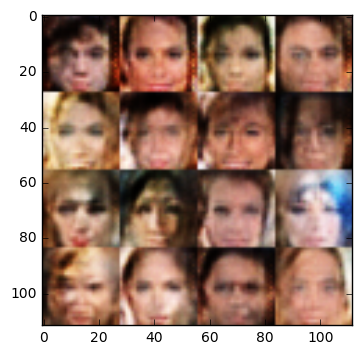

Epoch 1/1... Discriminator Loss: 1.1215... Generator Loss: 0.7906
Epoch 1/1... Discriminator Loss: 1.0903... Generator Loss: 1.1572
Epoch 1/1... Discriminator Loss: 1.3013... Generator Loss: 1.2570
Epoch 1/1... Discriminator Loss: 1.3411... Generator Loss: 0.9205
Epoch 1/1... Discriminator Loss: 1.2209... Generator Loss: 0.9344


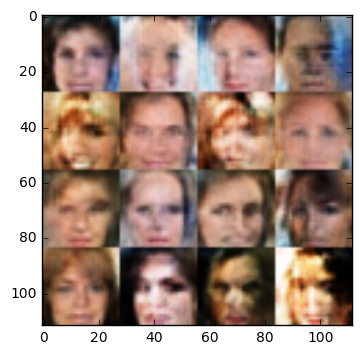

Epoch 1/1... Discriminator Loss: 1.1143... Generator Loss: 0.9614
Epoch 1/1... Discriminator Loss: 0.9624... Generator Loss: 1.1121
Epoch 1/1... Discriminator Loss: 1.2046... Generator Loss: 0.9115
Epoch 1/1... Discriminator Loss: 1.3668... Generator Loss: 0.7781
Epoch 1/1... Discriminator Loss: 1.3775... Generator Loss: 0.7083


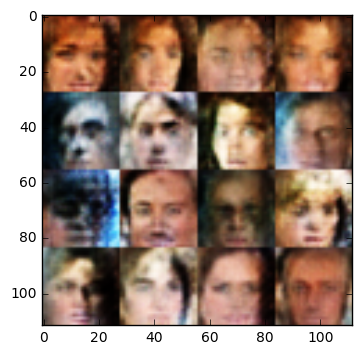

Epoch 1/1... Discriminator Loss: 1.1582... Generator Loss: 1.0275
Epoch 1/1... Discriminator Loss: 1.0266... Generator Loss: 1.1904
Epoch 1/1... Discriminator Loss: 1.1269... Generator Loss: 1.1510
Epoch 1/1... Discriminator Loss: 1.3806... Generator Loss: 0.7231
Epoch 1/1... Discriminator Loss: 1.2198... Generator Loss: 0.8803


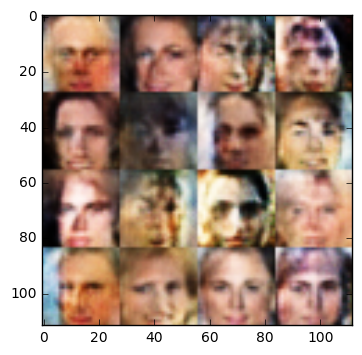

Epoch 1/1... Discriminator Loss: 1.2512... Generator Loss: 0.9452
Epoch 1/1... Discriminator Loss: 1.1583... Generator Loss: 0.8881
Epoch 1/1... Discriminator Loss: 1.1586... Generator Loss: 1.0732
Epoch 1/1... Discriminator Loss: 1.0989... Generator Loss: 0.9633
Epoch 1/1... Discriminator Loss: 1.2887... Generator Loss: 0.9531


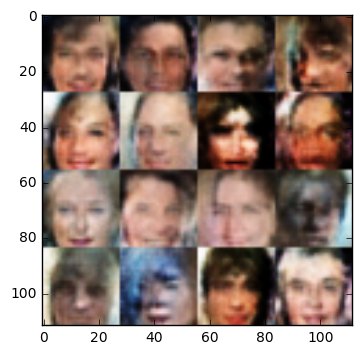

Epoch 1/1... Discriminator Loss: 1.3566... Generator Loss: 0.9638
Epoch 1/1... Discriminator Loss: 1.1296... Generator Loss: 1.0532
Epoch 1/1... Discriminator Loss: 1.2384... Generator Loss: 1.1613
Epoch 1/1... Discriminator Loss: 1.2369... Generator Loss: 0.8738
Epoch 1/1... Discriminator Loss: 1.1483... Generator Loss: 0.8984


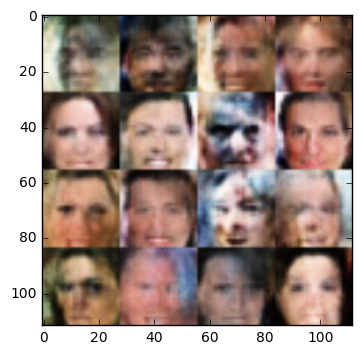

Epoch 1/1... Discriminator Loss: 1.2565... Generator Loss: 1.0466
Epoch 1/1... Discriminator Loss: 1.3733... Generator Loss: 0.7327
Epoch 1/1... Discriminator Loss: 1.0511... Generator Loss: 1.0869
Epoch 1/1... Discriminator Loss: 1.3041... Generator Loss: 0.9138
Epoch 1/1... Discriminator Loss: 1.4449... Generator Loss: 0.7533


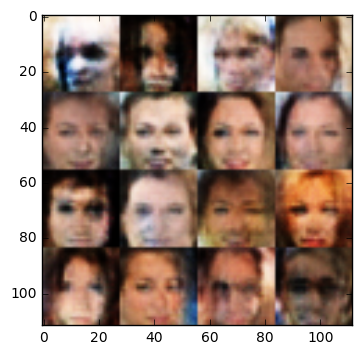

Epoch 1/1... Discriminator Loss: 1.3660... Generator Loss: 0.9045
Epoch 1/1... Discriminator Loss: 1.1421... Generator Loss: 0.8680
Epoch 1/1... Discriminator Loss: 1.2484... Generator Loss: 0.7058
Epoch 1/1... Discriminator Loss: 1.1232... Generator Loss: 0.8787
Epoch 1/1... Discriminator Loss: 1.0031... Generator Loss: 1.1576


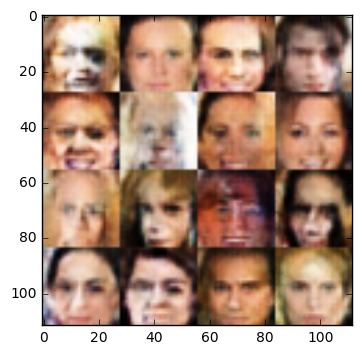

Epoch 1/1... Discriminator Loss: 1.2496... Generator Loss: 1.1786
Epoch 1/1... Discriminator Loss: 1.4222... Generator Loss: 0.8064
Epoch 1/1... Discriminator Loss: 1.0610... Generator Loss: 1.0951
Epoch 1/1... Discriminator Loss: 1.3829... Generator Loss: 0.6873
Epoch 1/1... Discriminator Loss: 1.1891... Generator Loss: 1.3414


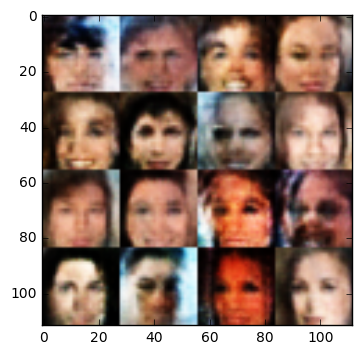

Epoch 1/1... Discriminator Loss: 1.3664... Generator Loss: 0.9250
Epoch 1/1... Discriminator Loss: 1.1917... Generator Loss: 1.1576
Epoch 1/1... Discriminator Loss: 1.2923... Generator Loss: 1.0062
Epoch 1/1... Discriminator Loss: 1.2547... Generator Loss: 0.8448
Epoch 1/1... Discriminator Loss: 1.2085... Generator Loss: 1.1268


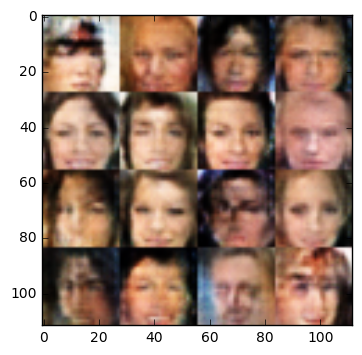

Epoch 1/1... Discriminator Loss: 1.4310... Generator Loss: 0.6153
Epoch 1/1... Discriminator Loss: 1.3806... Generator Loss: 0.8895
Epoch 1/1... Discriminator Loss: 1.3472... Generator Loss: 1.0421
Epoch 1/1... Discriminator Loss: 1.3197... Generator Loss: 0.8462
Epoch 1/1... Discriminator Loss: 1.3227... Generator Loss: 0.9492


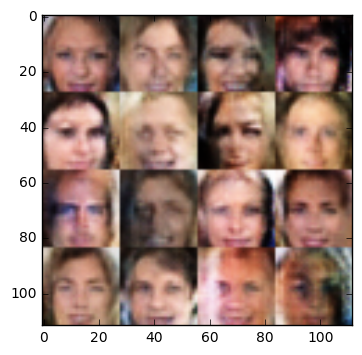

Epoch 1/1... Discriminator Loss: 1.2827... Generator Loss: 0.7786
Epoch 1/1... Discriminator Loss: 1.1504... Generator Loss: 0.8812
Epoch 1/1... Discriminator Loss: 1.2844... Generator Loss: 1.0098
Epoch 1/1... Discriminator Loss: 1.2477... Generator Loss: 0.9999
Epoch 1/1... Discriminator Loss: 1.1699... Generator Loss: 0.9479


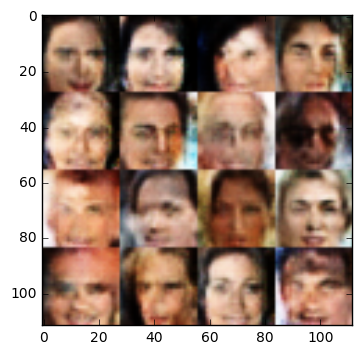

Epoch 1/1... Discriminator Loss: 1.2408... Generator Loss: 1.1865
Epoch 1/1... Discriminator Loss: 1.0647... Generator Loss: 1.0256
Epoch 1/1... Discriminator Loss: 1.2092... Generator Loss: 0.9291
Epoch 1/1... Discriminator Loss: 1.2583... Generator Loss: 1.3095
Epoch 1/1... Discriminator Loss: 1.1427... Generator Loss: 0.9386


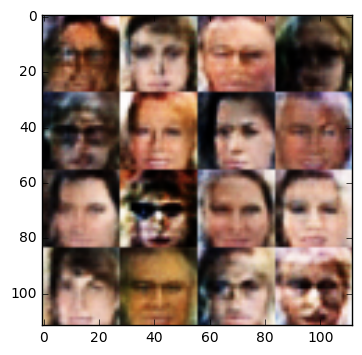

Epoch 1/1... Discriminator Loss: 1.4510... Generator Loss: 0.6626
Epoch 1/1... Discriminator Loss: 1.1719... Generator Loss: 1.0243
Epoch 1/1... Discriminator Loss: 1.3389... Generator Loss: 0.8728
Epoch 1/1... Discriminator Loss: 1.3283... Generator Loss: 0.9398
Epoch 1/1... Discriminator Loss: 1.2790... Generator Loss: 0.8417


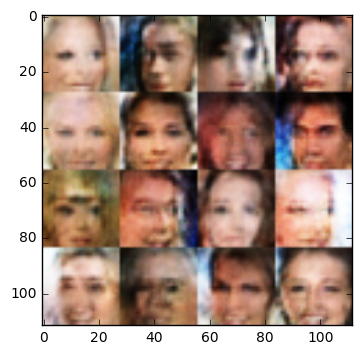

Epoch 1/1... Discriminator Loss: 1.2987... Generator Loss: 0.9927
Epoch 1/1... Discriminator Loss: 1.2713... Generator Loss: 0.9409
Epoch 1/1... Discriminator Loss: 1.3540... Generator Loss: 0.8107
Epoch 1/1... Discriminator Loss: 1.0867... Generator Loss: 1.2934
Epoch 1/1... Discriminator Loss: 1.1407... Generator Loss: 0.8834


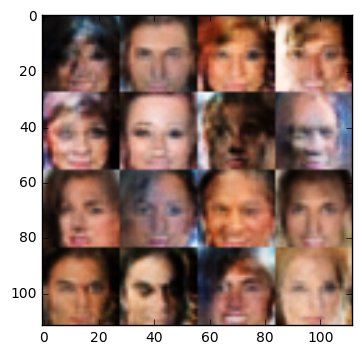

Epoch 1/1... Discriminator Loss: 1.2894... Generator Loss: 1.0020
Epoch 1/1... Discriminator Loss: 1.0622... Generator Loss: 1.1670
Epoch 1/1... Discriminator Loss: 1.4742... Generator Loss: 0.9747
Epoch 1/1... Discriminator Loss: 1.0521... Generator Loss: 1.1350
Epoch 1/1... Discriminator Loss: 1.3136... Generator Loss: 0.9508


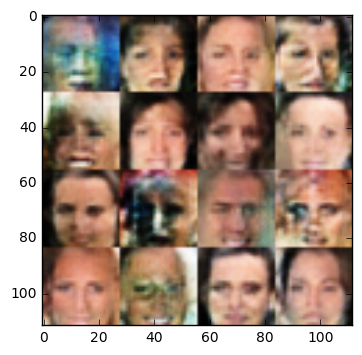

Epoch 1/1... Discriminator Loss: 1.0842... Generator Loss: 1.2727
Epoch 1/1... Discriminator Loss: 1.2767... Generator Loss: 0.9855
Epoch 1/1... Discriminator Loss: 1.1741... Generator Loss: 1.6025
Epoch 1/1... Discriminator Loss: 1.2345... Generator Loss: 1.1371
Epoch 1/1... Discriminator Loss: 1.3897... Generator Loss: 0.9920


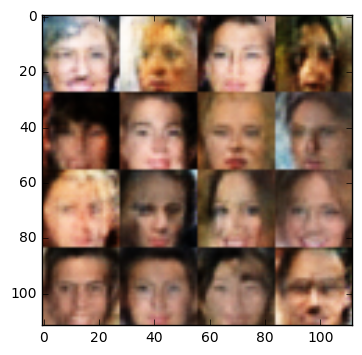

Epoch 1/1... Discriminator Loss: 1.3294... Generator Loss: 1.2771
Epoch 1/1... Discriminator Loss: 1.2365... Generator Loss: 0.8985
Epoch 1/1... Discriminator Loss: 1.3238... Generator Loss: 0.8100
Epoch 1/1... Discriminator Loss: 1.3860... Generator Loss: 1.0851
Epoch 1/1... Discriminator Loss: 1.2286... Generator Loss: 1.1405


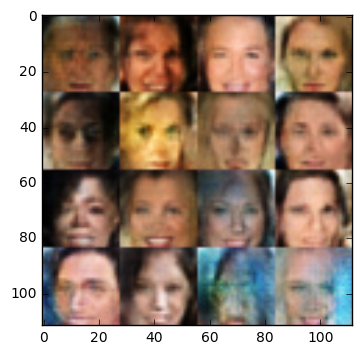

Epoch 1/1... Discriminator Loss: 1.3183... Generator Loss: 0.8559
Epoch 1/1... Discriminator Loss: 1.1704... Generator Loss: 0.7909
Epoch 1/1... Discriminator Loss: 1.2138... Generator Loss: 1.2376
Epoch 1/1... Discriminator Loss: 1.0079... Generator Loss: 1.1580
Epoch 1/1... Discriminator Loss: 1.2196... Generator Loss: 0.9729


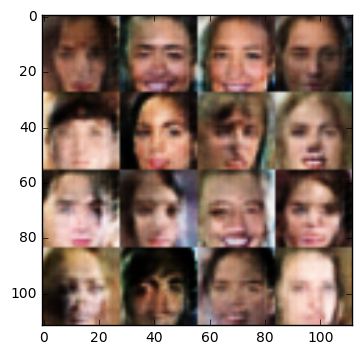

Epoch 1/1... Discriminator Loss: 1.3306... Generator Loss: 0.8554
Epoch 1/1... Discriminator Loss: 1.1859... Generator Loss: 1.1551
Epoch 1/1... Discriminator Loss: 1.2278... Generator Loss: 0.9592
Epoch 1/1... Discriminator Loss: 1.1330... Generator Loss: 1.2141
Epoch 1/1... Discriminator Loss: 1.2013... Generator Loss: 1.1450


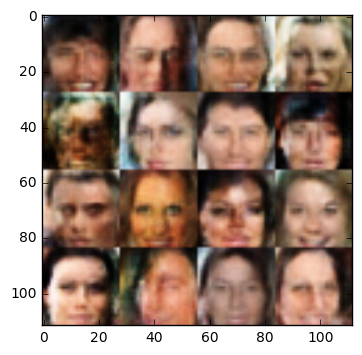

Epoch 1/1... Discriminator Loss: 1.2084... Generator Loss: 0.9133
Epoch 1/1... Discriminator Loss: 1.2759... Generator Loss: 1.0744
Epoch 1/1... Discriminator Loss: 1.3430... Generator Loss: 0.8771
Epoch 1/1... Discriminator Loss: 1.2919... Generator Loss: 0.8761
Epoch 1/1... Discriminator Loss: 1.3011... Generator Loss: 1.0813


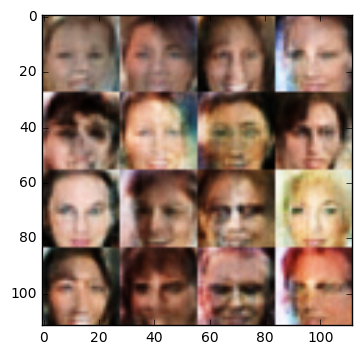

Epoch 1/1... Discriminator Loss: 1.2939... Generator Loss: 0.9266
Epoch 1/1... Discriminator Loss: 1.3052... Generator Loss: 1.0182
Epoch 1/1... Discriminator Loss: 1.2642... Generator Loss: 0.9164
Epoch 1/1... Discriminator Loss: 1.1992... Generator Loss: 0.9288
Epoch 1/1... Discriminator Loss: 1.2382... Generator Loss: 0.9312


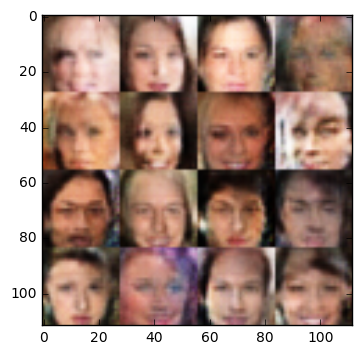

Epoch 1/1... Discriminator Loss: 1.4336... Generator Loss: 0.6841
Epoch 1/1... Discriminator Loss: 1.2526... Generator Loss: 0.8964
Epoch 1/1... Discriminator Loss: 1.4022... Generator Loss: 0.7673
Epoch 1/1... Discriminator Loss: 1.2807... Generator Loss: 0.8957
Epoch 1/1... Discriminator Loss: 1.4027... Generator Loss: 0.7277


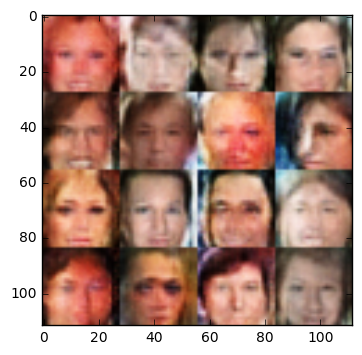

Epoch 1/1... Discriminator Loss: 1.2958... Generator Loss: 0.9768
Epoch 1/1... Discriminator Loss: 1.5013... Generator Loss: 0.6624
Epoch 1/1... Discriminator Loss: 1.5732... Generator Loss: 0.7145
Epoch 1/1... Discriminator Loss: 1.3873... Generator Loss: 1.1561
Epoch 1/1... Discriminator Loss: 1.2092... Generator Loss: 0.8691


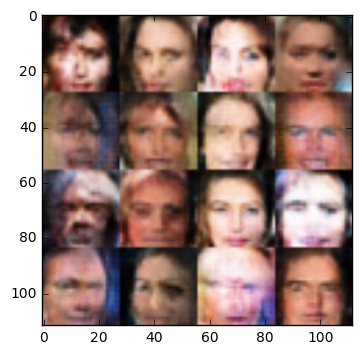

Epoch 1/1... Discriminator Loss: 1.2286... Generator Loss: 0.9002
Epoch 1/1... Discriminator Loss: 1.1542... Generator Loss: 0.8410
Epoch 1/1... Discriminator Loss: 1.2182... Generator Loss: 0.8148
Epoch 1/1... Discriminator Loss: 1.3792... Generator Loss: 0.9358
Epoch 1/1... Discriminator Loss: 1.4165... Generator Loss: 0.7361


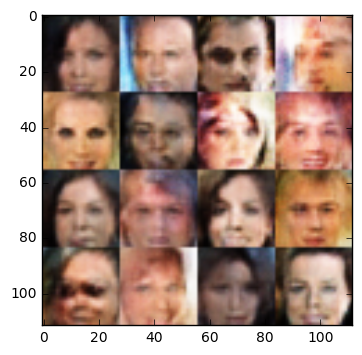

Epoch 1/1... Discriminator Loss: 1.5537... Generator Loss: 0.8606
Epoch 1/1... Discriminator Loss: 1.3196... Generator Loss: 1.0134
Epoch 1/1... Discriminator Loss: 1.1958... Generator Loss: 1.1218
Epoch 1/1... Discriminator Loss: 1.2609... Generator Loss: 1.1316
Epoch 1/1... Discriminator Loss: 1.0360... Generator Loss: 1.3933


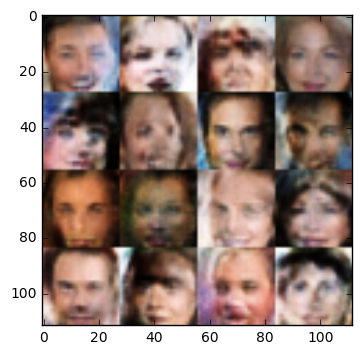

Epoch 1/1... Discriminator Loss: 1.3016... Generator Loss: 0.8709
Epoch 1/1... Discriminator Loss: 1.0539... Generator Loss: 1.6035
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 1.0857
Epoch 1/1... Discriminator Loss: 1.2447... Generator Loss: 1.0991
Epoch 1/1... Discriminator Loss: 1.3398... Generator Loss: 0.9766


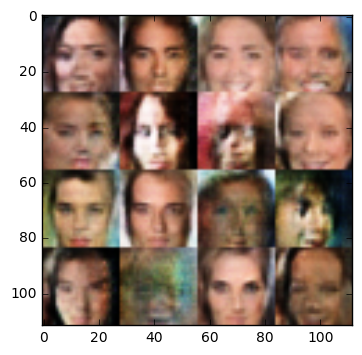

Epoch 1/1... Discriminator Loss: 1.4543... Generator Loss: 0.9606
Epoch 1/1... Discriminator Loss: 1.4411... Generator Loss: 0.7239
Epoch 1/1... Discriminator Loss: 1.2630... Generator Loss: 0.9678
Epoch 1/1... Discriminator Loss: 1.2133... Generator Loss: 0.8772
Epoch 1/1... Discriminator Loss: 1.2393... Generator Loss: 0.8018


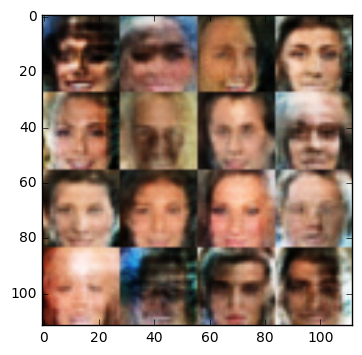

Epoch 1/1... Discriminator Loss: 1.0538... Generator Loss: 1.2513
Epoch 1/1... Discriminator Loss: 1.2268... Generator Loss: 0.7842


In [25]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.